In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams.update({'font.size': 18})
plt.rcParams['animation.html'] = 'jshtml'

In [2]:
import numpy as np
import matplotlib.patches as patches
from matplotlib import pyplot as plt
from matplotlib import animation
import matplotlib.transforms as mtransforms


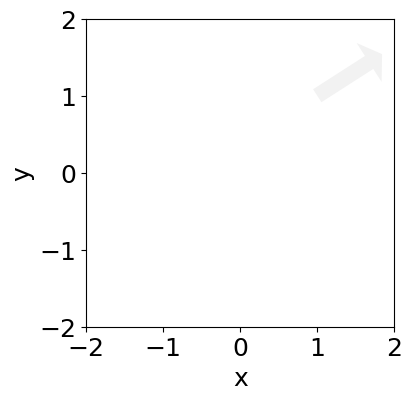

In [3]:
# Create figure
fig, ax = plt.subplots()

# Axes labels and title are established
ax = fig.gca()
ax.set_xlabel('x')
ax.set_ylabel('y')

ax.set_ylim(-2,2)
ax.set_xlim(-2,2)
plt.gca().set_aspect('equal', adjustable='box')

x = np.linspace(-1,1,20) 
y  = np.linspace(-1,1,20) 
dx = np.zeros(len(x))
dy = np.zeros(len(y))

for i in range(len(x)):
    dx[i] = np.sin(x[i])
    dy[i] = np.cos(y[i])
patch = patches.Arrow(x[0], y[0], dx[0], dy[0] )


def init():
    ax.add_patch(patch)
    return patch,

def animate(t):
    global patch
    
    t %= 20 # get only 0-19 to loop animation and get color t/20 as 0.0-1.0

    ax.patches.remove(patch)

    patch = patches.Arrow(x[t], y[t], dx[t], dy[t])

    patch.update({'facecolor': (t/20,t/20,t/20,1.0)})
    
    ax.add_patch(patch)

    return patch,

# plt.show()
anim = animation.FuncAnimation(fig, animate, 
                               init_func=init, 
                               interval=20,
                               blit=False,
                              repeat=False)
HTML(anim.to_jshtml())

In [4]:
int(0.5*1000)

500

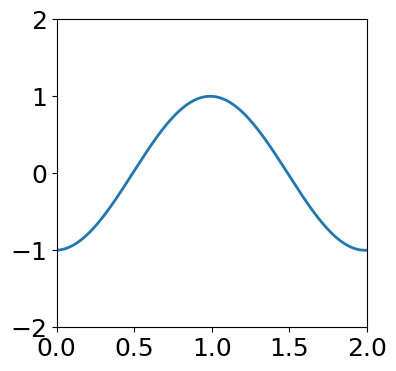

In [5]:
from matplotlib import animation
import matplotlib.pyplot as plt
import numpy as np


fig = plt.figure()
ax = plt.axes(xlim=(0, 2), ylim=(-2, 2))
line, = ax.plot([], [], lw=2)


init_func = np.zeros(1000)

def init():
    x = np.linspace(0, 2, 1000)
    y = np.sin(1 * np.pi * (x - 0.5))
    y[:int(0.5*1000)] = 0
    y[int(1.5*1000):] = 0
    init_func = y
    line.set_data(x, y)
    return line,

def simulate(i):
    x = np.linspace(0, 2, 1000)
    y = np.sin(1 * np.pi * (x - 0.5 - 0.01 * i))
    # (x - 0.5 - 0.01 * i)
    # y[:int(0.5*1000)] = 0
    y[int(1.5*1000):] = 0
    return x, y


def animate(i):
    x, y = simulate(i)
    line.set_data(x, y)
    return line,


anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20, blit=False)

HTML(anim.to_jshtml())

In [6]:
from matplotlib import animation
import numpy as np
import matplotlib.pyplot as plt

dx=0.1 #space increment
dt=0.05 #time increment
tmin=0.0 #initial time
tmax=2.0 #simulate until
xmin=-5.0 #left bound
xmax=5.0 #right bound...assume packet never reaches boundary
c=1.0 #speed of sound
rsq=(c*dt/dx)**2 #appears in finite diff sol

nx = int((xmax-xmin)/dx) + 1 #number of points on x grid
nt = int((tmax-tmin)/dt) + 2 #number of points on t grid
u = np.zeros((nt,nx)) #solution to WE

#set initial pulse shape
def init_fn(x):
    val = np.exp(-(x**2)/0.25)
    if val<.001:
        return 0.0
    else:
        return val

for a in range(0,nx):
    u[0,a]=init_fn(xmin+a*dx)
    u[1,a]=u[0,a]

#simulate dynamics
for t in range(1,nt-1):
    for a in range(1,nx-1):
        u[t+1,a] = 2*(1-rsq)*u[t,a]-u[t-1,a]+rsq*(u[t,a-1]+u[t,a+1])

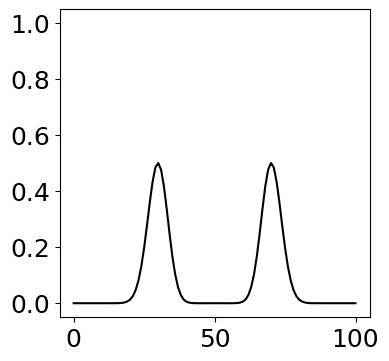

In [7]:
fig = plt.figure()
plts = []             # get ready to populate this list the Line artists to be plotted
# plt.hold("off")
for i in range(nt):
    p, = plt.plot(u[i,:], 'k')   # this is how you'd plot a single line...
    plts.append( [p] )           # ... but save the line artist for the animation
ani = animation.ArtistAnimation(fig, plts, interval=50, repeat_delay=3000)   # run the animation
# ani.save('wave.mp4')    # optionally save it to a file

HTML(ani.to_jshtml())

In [8]:
import cmath

In [9]:
z = cmath.exp(1j * np.pi / 2)
print(z)

(6.123233995736766e-17+1j)


In [10]:
num_samples = 10
cosines = np.cos(np.arange(0, 4*np.pi, 1/num_samples))
sines = np.sin(np.arange(0, 4*np.pi, 1/num_samples))

In [11]:
complex_num = cosines + 1j*sines


In [12]:
cmath.exp(complex_num[0])

(2.718281828459045+0j)

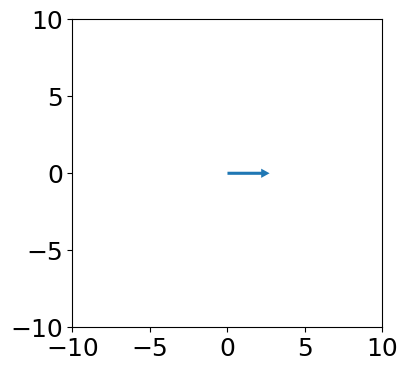

In [13]:
fig, ax = plt.subplots()
ax.set_ylim(-10,10)
ax.set_xlim(-10,10)
# Axes labels and title are established
ax = fig.gca()
patch = patches.Arrow(0,0, cmath.exp(complex_num[0]).real,cmath.exp(complex_num[0]).imag )

ax.add_patch(patch)

In [14]:
import torch
import cv2

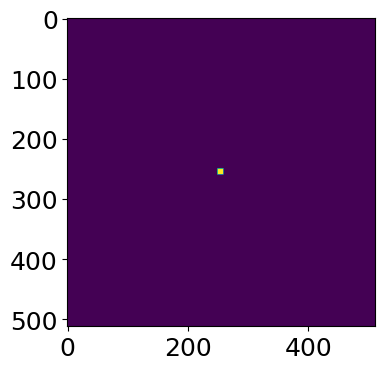

In [15]:
# in_img = cv2.imread("./start_signal.jpg", 0)
in_img = np.zeros((512,512))
in_img[250:260, 250:260] = 1
plt.imshow(in_img)

In [16]:
ft = np.fft.ifftshift(in_img)
ft

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]])

In [17]:
ft = np.fft.fft2(ft)
ft

array([[100.        +0.00000000e+00j,  99.92095836+1.83952974e+00j,
         99.68410234+3.67158290e+00j, ...,  99.2902375 -5.48871603e+00j,
         99.68410234-3.67158290e+00j,  99.92095836-1.83952974e+00j],
       [ 99.92095836+1.83952974e+00j,  99.8081405 +3.67615150e+00j,
         99.53777054+5.50239953e+00j, ...,  99.31272343-3.65790420e+00j,
         99.67285025-1.83496211e+00j,  99.87581789-1.66533454e-16j],
       [ 99.68410234+3.67158290e+00j,  99.53777054+5.50239953e+00j,
         99.23439739+7.31996891e+00j, ...,  99.17810473-1.82585392e+00j,
         99.50400781-4.44089210e-16j,  99.67285025+1.83496211e+00j],
       ...,
       [ 99.2902375 -5.48871603e+00j,  99.31272343-3.65790420e+00j,
         99.17810473-1.82585392e+00j, ...,  98.28425259-1.08995184e+01j,
         98.77505921-9.11690068e+00j,  99.1107903 -7.31085110e+00j],
       [ 99.68410234-3.67158290e+00j,  99.67285025-1.83496211e+00j,
         99.50400781+4.21884749e-15j, ...,  98.77505921-9.11690068e+00j,
       

In [18]:
ft = np.fft.fftshift(ft)
ft

array([[ 0.        +0.00000000e+00j,  0.        +0.00000000e+00j,
         0.        +0.00000000e+00j, ...,  0.        +0.00000000e+00j,
         0.        +0.00000000e+00j,  0.        +0.00000000e+00j],
       [ 0.        +0.00000000e+00j, -0.00375783-1.38408934e-04j,
        -0.00749558-4.14351765e-04j, ...,  0.01121865-4.13207231e-04j,
         0.00750575-1.38179677e-04j,  0.00376037+0.00000000e+00j],
       [ 0.        +0.00000000e+00j, -0.00749558-4.14351765e-04j,
        -0.01494602-1.10248491e-03j, ...,  0.02240772-4.12522804e-04j,
         0.01498663+1.11022302e-16j,  0.00750575+1.38179677e-04j],
       ...,
       [ 0.        +0.00000000e+00j,  0.01121865-4.13207231e-04j,
         0.02240772-4.12522804e-04j, ..., -0.03331075+3.69409240e-03j,
        -0.02231666+2.05981946e-03j, -0.01119584+8.25854471e-04j],
       [ 0.        +0.00000000e+00j,  0.00750575-1.38179677e-04j,
         0.01498663+1.11022302e-16j, ..., -0.02231666+2.05981946e-03j,
        -0.01494602+1.10248491e-03j

In [19]:
k_matrix = (-1j)*np.ones((512,512))


freqs = 1j* np.pi*torch.linspace(0, 512-1, 512)/512
frequencies_squared = freqs[:, None]**2 + freqs[None, :]**2

In [20]:
torch.tensor(k_matrix)

tensor([[0.-1.j, 0.-1.j, 0.-1.j,  ..., 0.-1.j, 0.-1.j, 0.-1.j],
        [0.-1.j, 0.-1.j, 0.-1.j,  ..., 0.-1.j, 0.-1.j, 0.-1.j],
        [0.-1.j, 0.-1.j, 0.-1.j,  ..., 0.-1.j, 0.-1.j, 0.-1.j],
        ...,
        [0.-1.j, 0.-1.j, 0.-1.j,  ..., 0.-1.j, 0.-1.j, 0.-1.j],
        [0.-1.j, 0.-1.j, 0.-1.j,  ..., 0.-1.j, 0.-1.j, 0.-1.j],
        [0.-1.j, 0.-1.j, 0.-1.j,  ..., 0.-1.j, 0.-1.j, 0.-1.j]],
       dtype=torch.complex128)

In [21]:

out = in_img

for i in range(20):
    ft = np.fft.fft2(out)
    
    out = torch.exp(torch.tensor(frequencies_squared)*0.1)*ft
    
    out = np.fft.ifft2(out)

C:\Users\akhil\AppData\Local\Temp\ipykernel_26236\2935654973.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  out = torch.exp(torch.tensor(frequencies_squared)*0.1)*ft


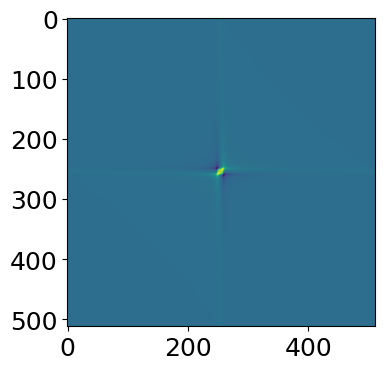

In [22]:
plt.imshow(out.real)

In [23]:
out

array([[9.53405283e-05-1.76692203e-06j, 9.53376669e-05-2.35451831e-06j,
        9.53346414e-05-2.94185269e-06j, ...,
        9.53536760e-05-1.66967135e-17j, 9.53481354e-05-5.89092356e-07j,
        9.53437335e-05-1.17834631e-06j],
       [9.53376669e-05-2.35451831e-06j, 9.53315095e-05-2.94173968e-06j,
        9.53252967e-05-3.52861292e-06j, ...,
        9.53599269e-05-5.88835578e-07j, 9.53515338e-05-1.17759526e-06j,
        9.53441006e-05-1.76642198e-06j],
       [9.53346414e-05-2.94185269e-06j, 9.53252967e-05-3.52861292e-06j,
        9.53157925e-05-4.11466552e-06j, ...,
        9.53666495e-05-1.17753223e-06j, 9.53551090e-05-1.76578357e-06j,
        9.53444049e-05-2.35414739e-06j],
       ...,
       [9.53536760e-05-9.10729825e-18j, 9.53599269e-05-5.88835578e-07j,
        9.53666495e-05-1.17753223e-06j, ...,
        9.53405283e-05+1.76692203e-06j, 9.53437335e-05+1.17834631e-06j,
        9.53481354e-05+5.89092356e-07j],
       [9.53481354e-05-5.89092356e-07j, 9.53515338e-05-1.17759526e-0

In [24]:
fft_im

NameError: name 'fft_im' is not defined

In [ ]:
thresh = 0.1
wave[wave<thresh][wave[wave<thresh]>-thresh]

In [ ]:
x = np.arange(-4*np.pi, 4*np.pi, 0.1)
wave = np.sin(x)
new_wave = wave
new_wave[:np.where(x == x[x<0.1][x[x<0.1]>-0.1][1])[0][0]] = 0
new_wave[np.where(x == x[x<2*np.pi][x[x<2*np.pi]>(2*np.pi-0.1)][0])[0][0]:] = 0

In [ ]:
plt.plot(x, new_wave)

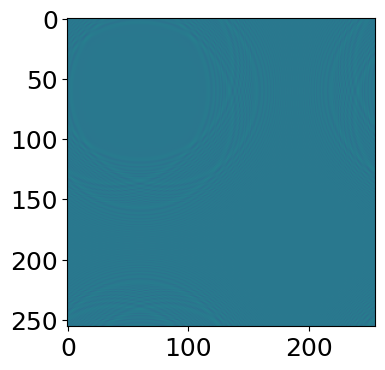

In [25]:
Nx, Ny = 256,256
dx=dy=0.5
mass = 0
c = 5
lamda = 0.5
gamma = 0

def f(kx, ky):
    return np.sqrt(mass**2 + c**2*(kx**2 + ky**2) + lamda*(kx**2 + ky**2)**2) - mass - 1j * gamma * np.sqrt(kx**2 + ky**2)


kx = np.array([[ np.pi * ((i+Nx//2)%Nx - Nx//2) / (Nx*dx)
              for j in range(Ny)] for i in range(Nx)])
ky = np.array([[ np.pi * ((j+Ny//2)%Ny - Ny//2) / (Ny*dy)
              for j in range(Ny)] for i in range(Nx)])

t = 0.1
exp_f_t = np.exp(-1j * t * f(kx,ky))


in_image = np.zeros((Nx,Ny))
in_image[40,60] = 255
in_image[60,40] = 255
in_image[80,60] = 255
in_image[60,80] = 255
# plt.imshow(in_img)

out = in_image
fig = plt.figure()
plts = [[plt.imshow(in_image, vmin=-50, vmax=75)]]

exp_f_t = np.exp(-1j * 0.5 * f(kx,ky))

for i in range(30):
    ft = np.fft.fft2(out)    
    
    out = ft*exp_f_t
    
    out = np.fft.ifft2(out)
    # plt.imshow(out.imag)
    plts.append( [plt.imshow(out.real, vmin=-50, vmax=75)] )


ani = animation.ArtistAnimation(fig, plts, interval=100, repeat_delay=3000)   # run the animation
ani.save('wave.gif')    # optionally save it to a file

HTML(ani.to_jshtml())

In [ ]:
out = cv2.imread("./northeastern.png", 0)
out = cv2.resize(out, (256,256))
plt.imshow(out)

In [ ]:
plts = []
fig = plt.figure()
for out in out_ims:
    plts.append([plt.imshow(out.real)])

ani = animation.ArtistAnimation(fig, plts, interval=100, repeat_delay=3000)   # run the animation
ani.save('wave.gif')    # optionally save it to a file

HTML(ani.to_jshtml())

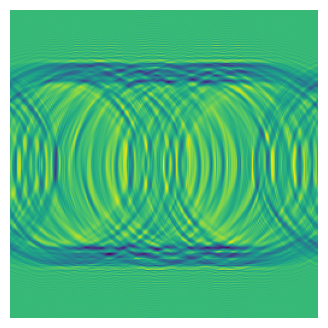

In [28]:
out = cv2.imread("./northeastern.png", 0)
out = cv2.resize(out, (256,256))
out_ims = []
plts = []
fig = plt.figure()

for i in range(30):
    ft = np.fft.fft2(out)    
    
    out = ft*exp_f_t
    
    out = np.fft.ifft2(out)
    out_ims.append( out )
    plts.append( [plt.imshow(out.real)] )
    plt.axis('off')


ani = animation.ArtistAnimation(fig, plts, interval=100, repeat_delay=3000)   # run the animation
ani.save('wave.gif')    # optionally save it to a file

HTML(ani.to_jshtml())

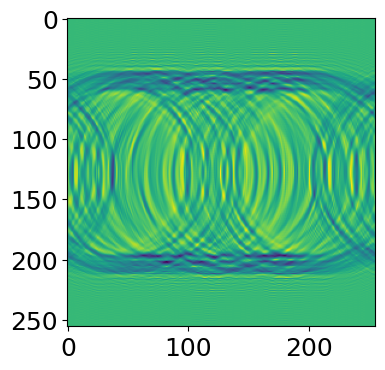

In [27]:
plt.imshow(out_ims[29].real)

In [669]:
len(out_ims)

30

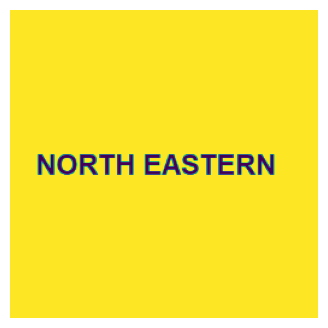

In [29]:
new_out = out_ims[29].conj()
new_outs = []
plts = []
fig = plt.figure()

for i in range(30):
    ft = np.fft.fft2(new_out)    
    
    new_out = ft*exp_f_t
    
    new_out = np.fft.ifft2(new_out)
    new_outs.append( new_out )
    plt.axis('off')
    plts.append( [plt.imshow(new_out.real)] )


ani = animation.ArtistAnimation(fig, plts, interval=100, repeat_delay=3000)   # run the animation
ani.save('wave_r.gif')    # optionally save it to a file

HTML(ani.to_jshtml())

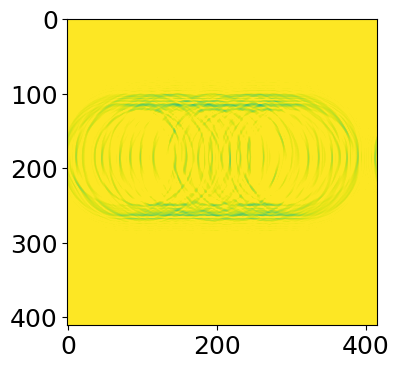

In [696]:
plt.imshow(new_outs[0].real, vmin=-255, vmax=255)

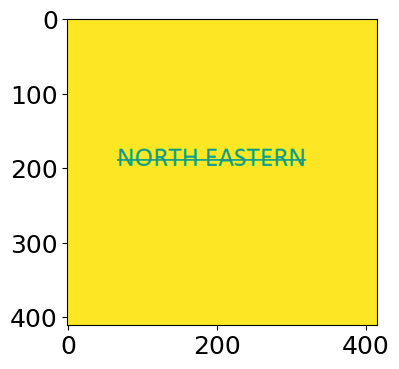

In [694]:
inp = cv2.imread("./northeastern.png", 0)
plt.imshow(inp, vmin=-255, vmax=255)

In [689]:
new_out[29].real

array([255., 255., 255., 255., 255., 255., 255., 255., 255., 255., 255.,
       255., 255., 255., 255., 255., 255., 255., 255., 255., 255., 255.,
       255., 255., 255., 255., 255., 255., 255., 255., 255., 255., 255.,
       255., 255., 255., 255., 255., 255., 255., 255., 255., 255., 255.,
       255., 255., 255., 255., 255., 255., 255., 255., 255., 255., 255.,
       255., 255., 255., 255., 255., 255., 255., 255., 255., 255., 255.,
       255., 255., 255., 255., 255., 255., 255., 255., 255., 255., 255.,
       255., 255., 255., 255., 255., 255., 255., 255., 255., 255., 255.,
       255., 255., 255., 255., 255., 255., 255., 255., 255., 255., 255.,
       255., 255., 255., 255., 255., 255., 255., 255., 255., 255., 255.,
       255., 255., 255., 255., 255., 255., 255., 255., 255., 255., 255.,
       255., 255., 255., 255., 255., 255., 255., 255., 255., 255., 255.,
       255., 255., 255., 255., 255., 255., 255., 255., 255., 255., 255.,
       255., 255., 255., 255., 255., 255., 255., 25

In [690]:
new_outs[28].real

array([[254.9999996 , 255.0000004 , 254.9999996 , ..., 255.0000004 ,
        254.9999996 , 255.0000004 ],
       [255.00000043, 254.99999957, 255.00000043, ..., 254.99999957,
        255.00000043, 254.99999957],
       [254.99999954, 255.00000046, 254.99999954, ..., 255.00000046,
        254.99999954, 255.00000046],
       ...,
       [255.00000031, 254.99999969, 255.00000031, ..., 254.99999969,
        255.00000031, 254.99999969],
       [254.99999966, 255.00000034, 254.99999966, ..., 255.00000034,
        254.99999966, 255.00000034],
       [255.00000037, 254.99999963, 255.00000037, ..., 254.99999963,
        255.00000037, 254.99999963]])